In [137]:
# What do we want to recommend?
# In this case, books!
# We're simulating a books recommendation system. Imagine that it is aligned with the commercial manager and Shop interests

In [138]:
###Frameworks###

# Data Modelling
import pandas as pd
import numpy as np

# graphic analysis
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# Images and URLs
from PIL import Image as PILImage
import io
import urllib.error
import urllib
import requests
import matplotlib.image as mpimg
import plotly.graph_objects as go
from plotly.subplots import make_subplots

#warnings
import warnings
warnings.filterwarnings('ignore')

#Pandas adjustments
pd.set_option('display.max_rows', 100) #how many rows to be shown
pd.set_option('display.max_columns', 50) #how many columns to be shown

#matplotlib adjustments
plt.rcParams['figure.figsize'] = (15,6) #graphic size
plt.style.use('seaborn-darkgrid') #graphic visual-style


In [139]:
#Reading data
books_data = pd.read_csv('Books.csv')
rating_data = pd.read_csv('Ratings.csv')
users_data = pd.read_csv('Users.csv')

# databases dimension [rows, columns]
books_data.shape, rating_data.shape, users_data.shape

((271360, 8), (1149780, 3), (278858, 3))

In [140]:
#checking the first lines
books_data.head()

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...
1,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...
2,0060973129,Decision in Normandy,Carlo D'Este,1991,HarperPerennial,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...
3,0374157065,Flu: The Story of the Great Influenza Pandemic...,Gina Bari Kolata,1999,Farrar Straus Giroux,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...
4,0393045218,The Mummies of Urumchi,E. J. W. Barber,1999,W. W. Norton &amp; Company,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...


In [141]:
# we can see that the column year-of-publication is an object type, it should be an int or Float. We need to correct it during the code
books_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 271360 entries, 0 to 271359
Data columns (total 8 columns):
 #   Column               Non-Null Count   Dtype 
---  ------               --------------   ----- 
 0   ISBN                 271360 non-null  object
 1   Book-Title           271360 non-null  object
 2   Book-Author          271359 non-null  object
 3   Year-Of-Publication  271360 non-null  object
 4   Publisher            271358 non-null  object
 5   Image-URL-S          271360 non-null  object
 6   Image-URL-M          271360 non-null  object
 7   Image-URL-L          271357 non-null  object
dtypes: object(8)
memory usage: 16.6+ MB


In [142]:
#checking the first lines
rating_data.head() #book-rating goes from 0 to 10.

,User-ID,ISBN,Book-Rating
0,276725,034545104X,0
1,276726,0155061224,5
2,276727,0446520802,0
3,276729,052165615X,3
4,276729,0521795028,6


In [143]:
rating_data.info() # the rating columns already is an int type, so it's ok.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1149780 entries, 0 to 1149779
Data columns (total 3 columns):
 #   Column       Non-Null Count    Dtype 
---  ------       --------------    ----- 
 0   User-ID      1149780 non-null  int64 
 1   ISBN         1149780 non-null  object
 2   Book-Rating  1149780 non-null  int64 
dtypes: int64(2), object(1)
memory usage: 26.3+ MB


In [144]:
#checking the first lines
users_data.head()

,User-ID,Location,Age
0,1,"nyc, new york, usa",NaN
1,2,"stockton, california, usa",18.0
2,3,"moscow, yukon territory, russia",NaN
3,4,"porto, v.n.gaia, portugal",17.0
4,5,"farnborough, hants, united kingdom",NaN


In [145]:
users_data.info() #all good in this data types. No need to correct it

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 278858 entries, 0 to 278857
Data columns (total 3 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   User-ID   278858 non-null  int64  
 1   Location  278858 non-null  object 
 2   Age       168096 non-null  float64
dtypes: float64(1), int64(1), object(1)
memory usage: 6.4+ MB


In [146]:
###DATA MODELLING###

#Joining the tables books_data and rating_data using the ISBN as the Key.
books_ratingDF = books_data.merge(rating_data, how='inner', on='ISBN')

#And then we can join the result with the users_data table.
allDataDF = books_ratingDF.merge(users_data, how='inner', on='User-ID')
allDataDF.shape

(1031136, 12)

In [147]:
#now, we need to re-check the type of all columns, now that we've merged all 3 tables
allDataDF.info()

'''
How to investigate where the register doesn't fit to the column
for line in allDataDF['Year-Of-Publication'].value_counts().index:
  print(line)

  allDataDF.loc[allDataDF['Year-Of-Publication'] == 'DK Publising Inc']
    allDataDF.loc[allDataDF['Year-Of-Publication'] == 'Gallimard']

    once we find the index and whats on it, we replace it for a blank space, since we do not have the correct data.


'''
#see that are 2 things we need to correct, 1 - the year-of-publication datatype /
allDataDF.iloc[352361, 3] = ''
allDataDF.iloc[467962, 3] = ''
allDataDF.iloc[469216, 3] = ''
allDataDF.iloc[287500, 3] = ''
# 2 - not exactly correct, but we need to retrieve only the country that the rating comes from (location column)
allDataDF['Year-Of-Publication'] = pd.to_numeric(allDataDF['Year-Of-Publication'])

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1031136 entries, 0 to 1031135
Data columns (total 12 columns):
 #   Column               Non-Null Count    Dtype  
---  ------               --------------    -----  
 0   ISBN                 1031136 non-null  object 
 1   Book-Title           1031136 non-null  object 
 2   Book-Author          1031135 non-null  object 
 3   Year-Of-Publication  1031136 non-null  object 
 4   Publisher            1031134 non-null  object 
 5   Image-URL-S          1031136 non-null  object 
 6   Image-URL-M          1031136 non-null  object 
 7   Image-URL-L          1031132 non-null  object 
 8   User-ID              1031136 non-null  int64  
 9   Book-Rating          1031136 non-null  int64  
 10  Location             1031136 non-null  object 
 11  Age                  753301 non-null   float64
dtypes: float64(1), int64(2), object(9)
memory usage: 102.3+ MB


In [148]:
allDataDF.loc[allDataDF['Year-Of-Publication'] == 'Gallimard']

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L,User-ID,Book-Rating,Location,Age


In [149]:
#retrieving just the country from the 'Location' column

def ext_country(region):
  register = region
  register = region.split(',')
  fraction = register[-1].upper()
  return fraction

#Creating the Country Column
allDataDF['Country'] = allDataDF['Location'].apply(ext_country)

allDataDF.head()


,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L,User-ID,Book-Rating,Location,Age,Country
0,0195153448,Classical Mythology,Mark P. O. Morford,2002.0,Oxford University Press,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,2,0,"stockton, california, usa",18.0,USA
1,0002005018,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,8,5,"timmins, ontario, canada",NaN,CANADA
2,0060973129,Decision in Normandy,Carlo D'Este,1991.0,HarperPerennial,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...,8,0,"timmins, ontario, canada",NaN,CANADA
3,0374157065,Flu: The Story of the Great Influenza Pandemic...,Gina Bari Kolata,1999.0,Farrar Straus Giroux,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...,8,0,"timmins, ontario, canada",NaN,CANADA
4,0393045218,The Mummies of Urumchi,E. J. W. Barber,1999.0,W. W. Norton &amp; Company,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...,8,0,"timmins, ontario, canada",NaN,CANADA


In [150]:
### DATA VISUALIZATION ###
#investigate the data to see if there's something wrong
# If the book-rating equals to 0 (zero) it means that the customer didn't rated it, so we can put that evaluation aside, otherwise it'll compromise the system.
allDataDF.describe()

,Year-Of-Publication,User-ID,Book-Rating,Age
count,1.031132e+06,1.031136e+06,1.031136e+06,753301.000000
mean,1.968195e+03,1.405945e+05,2.839051e+00,37.397648
std,2.311015e+02,8.052466e+04,3.854157e+00,14.098254
min,0.000000e+00,2.000000e+00,0.000000e+00,0.000000
25%,1.992000e+03,7.041500e+04,0.000000e+00,28.000000
50%,1.997000e+03,1.412100e+05,0.000000e+00,35.000000
75%,2.001000e+03,2.114260e+05,7.000000e+00,45.000000
max,2.050000e+03,2.788540e+05,1.000000e+01,244.000000


In [151]:
#lets filter by excluding the book-ratings = 0
allDataDF = allDataDF.loc[allDataDF['Book-Rating'] > 0]

#See that when we considered the 0 ratings, the mean was 2.83, wich is a poor rating
#Now that we excluded the cases where no rating was made (=0) the mean is 7.62.
allDataDF['Book-Rating'].describe()

count    383842.000000
mean          7.626701
std           1.841339
min           1.000000
25%           7.000000
50%           8.000000
75%           9.000000
max          10.000000
Name: Book-Rating, dtype: float64

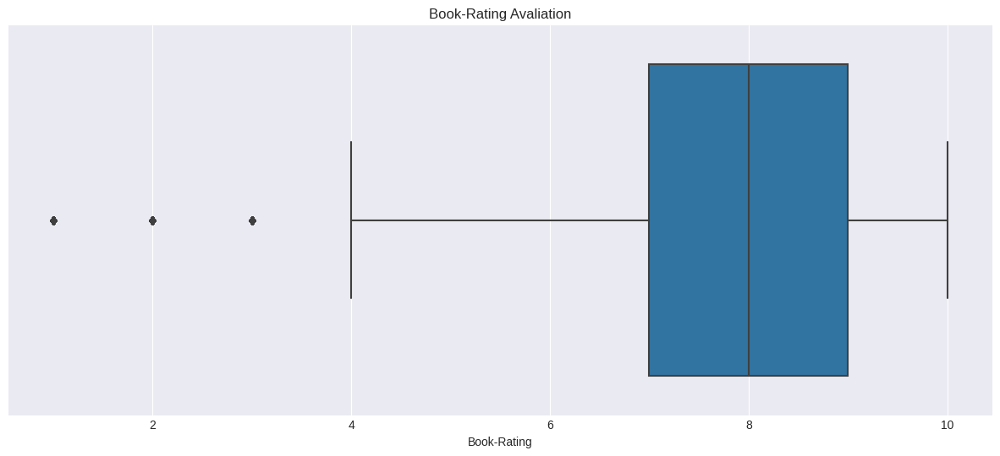

In [152]:
#graphic analysis
plt.title('Book-Rating Avaliation')
sns.boxplot(data=allDataDF, x='Book-Rating');

In [153]:
# Visualizing the books, how many times clients rated it, average rate score, max rate, mininum rate, median rate
analysis = allDataDF.groupby( by=['Book-Title']).agg(
    Quantity = ('Book-Title', 'count'),
    Avg = ('Book-Rating', 'mean'),
    Max = ('Book-Rating', 'max'),
    Min = ('Book-Rating', 'min'),
    Median = ('Book-Rating', 'median')
)

analysis.head()

,Quantity,Avg,Max,Min,Median
Book-Title,,,,,
"A Light in the Storm: The Civil War Diary of Amelia Martin, Fenwick Island, Delaware, 1861 (Dear America)",1,9.000000,9,9,9.0
"Ask Lily (Young Women of Faith: Lily Series, Book 5)",1,8.000000,8,8,8.0
Dark Justice,1,10.000000,10,10,10.0
"Earth Prayers From around the World: 365 Prayers, Poems, and Invocations for Honoring the Earth",7,7.142857,10,1,7.0
Final Fantasy Anthology: Official Strategy Guide (Brady Games),2,10.000000,10,10,10.0


In [154]:
#Most times evaluated books
analysis.sort_values('Quantity', ascending = False).head()

,Quantity,Avg,Max,Min,Median
Book-Title,,,,,
The Lovely Bones: A Novel,707,8.185290,10,1,8.0
Wild Animus,581,4.390706,10,1,4.0
The Da Vinci Code,494,8.439271,10,1,9.0
The Secret Life of Bees,406,8.477833,10,2,9.0
The Nanny Diaries: A Novel,393,7.437659,10,1,8.0


In [155]:
#Analysis - Quantity x Rating
px.scatter(
    data_frame=analysis,
    x='Quantity', y='Avg',
    title= 'Quantity x Avg Rating - Titles',
    marginal_y='rug', marginal_x='histogram'
)

In [156]:
#Since there are some books that have a low quantity of evaluations it may interfere in the bussiness wished outcome, so we gonna group it to have better visualization
#after this function we're now able to recommend only books that have been evaluated at least 50 times or more. See that it's not a rule, but a bussiness choice to not use books with fewer evaluations, this may depend on the bussiness we're applying this code.

def qtd_classification(Quantity) :

  if int(Quantity) <=5:
    return '1-5 Evaluations'

  elif int (Quantity) <=10:
    return '6-10 Evaluations'

  elif int (Quantity) <=50:
    return '11-50 Evaluations'

  elif int(Quantity) <= 100:
    return '51-100 Evaluations'

  else:
    return '>101 Evaluations'

Pizza_graph = analysis['Quantity'].apply(qtd_classification).value_counts(normalize=True)
Pizza_graph = pd.DataFrame(Pizza_graph).reset_index()

#plot
px.pie(
    data_frame = Pizza_graph,
    names = 'index', values='Quantity',
    title='Quantities Division')

In [157]:
allDataDF['Year-Of-Publication'] = pd.to_numeric(allDataDF['Year-Of-Publication'], errors='coerce')
Year_analysis = allDataDF['Year-Of-Publication'].value_counts().sort_index().reset_index()
Year_analysis.describe()

,index,Year-Of-Publication
count,105.000000,105.000000
mean,1934.028571,3655.628571
std,210.090432,8051.797181
min,0.000000,1.000000
25%,1937.000000,4.000000
50%,1963.000000,63.000000
75%,1989.000000,1652.000000
max,2050.000000,37986.000000


<BarContainer object of 20 artists>

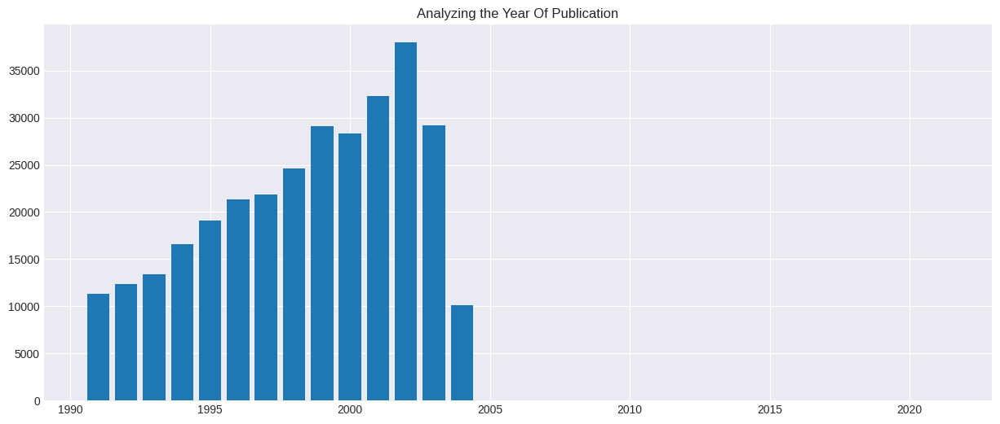

In [158]:
#Filtering by year of publication.... Although the year of publication IN THIS CASE is not that important to the recommendation system, but it's good to know
Filter = Year_analysis.loc[(Year_analysis['index']> 1990)& (Year_analysis['index']< 2023)]
plt.title('Analyzing the Year Of Publication')
plt.bar(Filter['index'], Filter['Year-Of-Publication'])

In [159]:
#Now we grouped the evaluations(book-ratings) by Author, so we can visualize the 10 best evaluated Authors from our book inventory!
allDataDF.groupby(by = 'Book-Author').agg(
    Quantity = ('Book-Rating', 'count'),
    Avg = ('Book-Rating', 'mean'),
).sort_values('Quantity', ascending=False).head(10)

,Quantity,Avg
Book-Author,,
Stephen King,4639,7.815046
Nora Roberts,2938,7.629680
John Grisham,2550,7.523137
James Patterson,2387,7.697947
J. K. Rowling,1746,8.970218
Mary Higgins Clark,1677,7.503280
Janet Evanovich,1490,7.944966
Dean R. Koontz,1475,7.572203
Anne Rice,1245,7.387952


In [160]:
#Now by country/region // We can see that is from the USA that come most of our book-ratings - 68%, followed by Canada
allDataDF['Country'].value_counts(normalize = True).head(10)*100

 USA               68.378135
 CANADA             9.267876
 UNITED KINGDOM     3.854190
 GERMANY            3.165625
                    2.737845
 SPAIN              1.874990
 AUSTRALIA          1.821322
 N/A                1.811943
 FRANCE             1.207789
 PORTUGAL           0.897505
Name: Country, dtype: float64

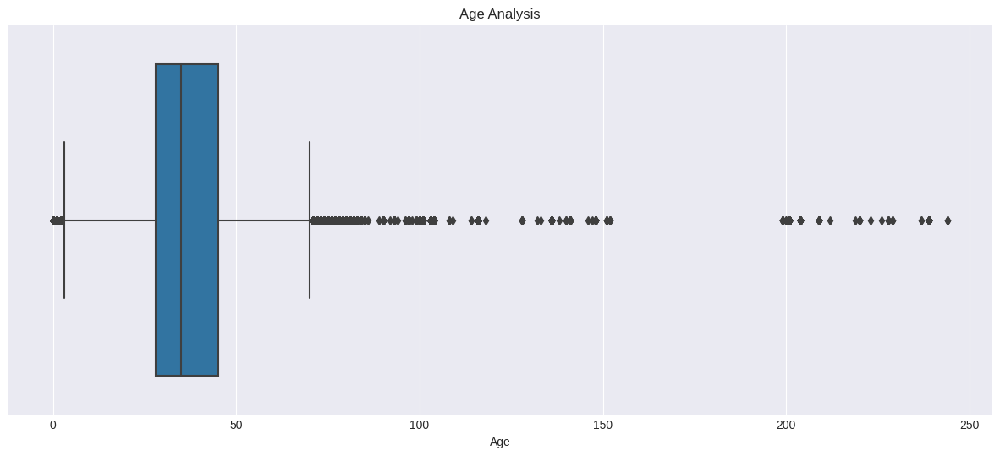

In [161]:
# Age, it could be an important metric to some recomendation systems, but not for us. This recommendation system consider the Book-Rating, country, book-author, but not the Age Column.
plt.title('Age Analysis')
sns.boxplot(data = allDataDF, x='Age');

In [162]:
#Data Adjustment (Book-rating)

#Adjusting the analysis DF
Evaluations = analysis.reset_index().iloc[:, 0:2]

finalDataDF = allDataDF.merge(Evaluations, how='inner', on='Book-Title')
finalDataDF.head()

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L,User-ID,Book-Rating,Location,Age,Country,Quantity
0,0002005018,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,8,5,"timmins, ontario, canada",NaN,CANADA,9
1,0002005018,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,11676,8,"n/a, n/a, n/a",NaN,N/A,9
2,0002005018,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,67544,8,"toronto, ontario, canada",30.0,CANADA,9
3,0002005018,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,116866,9,"ottawa, ,",NaN,,9
4,0002005018,Clara Callan,Richard Bruce Wright,2001.0,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,123629,9,"kingston, ontario, canada",NaN,CANADA,9


In [163]:
#Filtering the books by Book-Rating Quantity
Evaluated_Books = finalDataDF.loc[finalDataDF['Quantity']>= 50]
Evaluated_Books.shape


(65477, 14)

In [164]:
#important to verify if there is any duplicated data, and it returned 0. All good.
Evaluated_Books.duplicated().sum()

0

In [165]:
#the matrix for the machine learning // Criteria that the algorithm uses
Matrix = Evaluated_Books.pivot_table(values='Book-Rating', index='Book-Title', columns='User-ID')
Matrix.fillna(0, inplace=True)
Matrix.head()

User-ID,9,16,26,32,42,51,91,97,99,114,125,165,169,183,185,224,226,242,243,244,254,256,272,280,332,...,278633,278641,278645,278653,278663,278672,278683,278698,278723,278732,278740,278755,278773,278786,278798,278800,278807,278824,278828,278832,278836,278843,278844,278846,278854
Book-Title,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1984,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1st to Die: A Novel,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2nd Chance,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4 Blondes,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
84 Charing Cross Road,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [166]:
#Transforming to vect
from scipy.sparse import csc_matrix
Matrix_sparse = csc_matrix(Matrix)

Matrix_sparse

<651x24863 sparse matrix of type '<class 'numpy.float64'>'
	with 65081 stored elements in Compressed Sparse Column format>

In [190]:
#algorithm
from sklearn.neighbors import NearestNeighbors

Model = NearestNeighbors(
      #How many recommendations
      n_neighbors=7,
      #Algorithm
      algorithm='brute',
      #Distance Metric
      metric='minkowski'
  )
Model.fit(Matrix_sparse)


NearestNeighbors(algorithm='brute', n_neighbors=7)

In [191]:
# '''
# How to find the book index for the choice.
# so we can simulate the customer original's choice and the recommendations
# '''
# for Position, Book_Title in enumerate(Matrix.index):
#   if 'Harry' in Book_Title:
#     print(Position, Book_Title)



In [192]:

#Recommendations
#Choosing the book that was originally bought or searched by the client
#213 is the index of a Harry Potter book
Choose_Book = Matrix.iloc[216, :].values.reshape(1, -1)

#Passing into the model to recommend
Distance, Recommendation = Model.kneighbors(Choose_Book)

### BASED ON THE BOOK-RATING ###

### RECOMMENDATION ###
for Loop in range(len(Recommendation)):
  print(Matrix.index[Recommendation[Loop]])


Index(['Harry Potter and the Prisoner of Azkaban (Book 3)',
       'Harry Potter and the Goblet of Fire (Book 4)',
       'Harry Potter and the Chamber of Secrets (Book 2)',
       'Harry Potter and the Sorcerer's Stone (Book 1)', '4 Blondes',
       'The Reptile Room (A Series of Unfortunate Events, Book 2)',
       'My Gal Sunday'],
      dtype='object', name='Book-Title')


In [183]:
#Just to know the index of the books recommended
Recommendation

array([[216, 214, 213, 217,   3, 554]])

In [193]:
### SIMULATOR  ###
# Let's show the customer the Book-Cover of the recommendations

# List to receive the links of the recommendations
List_URL = []

# Loop
for Loop in range( len(Recommendation) ):

  # Matrix Filter
  Selection_Loop = ( Matrix.index[ Recommendation[Loop] ] )

  # List
  List_URL = Selection_Loop

#Headers for the request, otherwise it may cause error HTML 403 FORBIDDEN
headers = {'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/91.0.4472.124 Safari/537.36'}

#To store the Book-Covers images
Images = []

for i in range(1, 7):
  #links
  Recommendations_Links = allDataDF.loc[allDataDF['Book-Title'] == List_URL[i]].head(1)['Image-URL-L'].values[0]

  #Error treatment, so our code doesn't crash
  try:
    request = urllib.request.Request(Recommendations_Links, headers=headers)
    img_data = urllib.request.urlopen(request).read()

    img = PILImage.open(io.BytesIO(img_data))
    Images.append(img)

  except urllib.error.HTTPError as e:
    print(f"HTTP ERROR when acessing the URL{Recommendations_Links}: {e}")


Book_Titles = ['Selection', 'Recommendation 1', 'Recommendation 2', 'Recommendation 3', 'Recommendation 4', 'Recommendation 5', 'Recommendation 6']

#Creating the figure
Figure = make_subplots(rows=1, cols=7, subplot_titles=Book_Titles)

#Setting the layout
Figure.update_layout(height=500, width=1500, title_text='Recommendation System', showlegend=False)

# Adding images to the figure
Figure.add_trace(go.Image(z=Images[0]), row=1, col=1)

#A loop so we can show the images of the recommendations
for i in range(1, 7):
    Figure.add_trace(go.Image(z=Images[i-1]), row=1, col=i+1)  # Images from recommendations from 1 to 6

#Showing it
Figure.show()


